In [15]:
!hostname

n96.clstr


This Jupyter notebook Consists of: 
- 

- ERA5 4km resolution Map with Fairbanks oulined 
- Seasonal Daily Count GIFs from 1940-2023
- Seasonaly Hourly Count GIFs from 1940-2023
- Average hourly count plot from 1940-2023 
- Small playing around with the max day pixel
- Adding each pixel of hours to find total hours experienced 
- Trend / Rolling Mean analysis , 30 year 20 year 10 year chunk analysis 
- Trend of ROS event hours Spatially!

In [3]:
import xarray as xr
import os
import glob
import geopandas as gpd
import pandas as pd
import numpy as np
import re
from scipy.stats import linregress
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from matplotlib.ticker import MaxNLocator

Loading in the data 

In [4]:
path='/import/c1/DYNDOWN/phutton5/ROS/FNSB/FNSB_netcdf_files/ROS_Tlevels/'
pattern=f'ROS_Tl*.nc'
file_list = sorted(glob.glob(os.path.join(path, pattern)))
data = xr.open_mfdataset(file_list, combine='by_coords',engine='netcdf4')

start_year = '1950-1951'
data = data.sel(season=data.season >= start_year)


Loading in the shapefiles for boundary and Fairbanks 

In [5]:
shapefile_path = "/center1/DYNDOWN/phutton5/ROS/boundaries/Alaska_Borough_and_Census_Area_Boundaries.shp"
borough_boundaries = gpd.read_file(shapefile_path)
borough_boundaries = borough_boundaries.set_crs(epsg=3338)
borough_boundaries = borough_boundaries.to_crs(epsg=4326)
FNSB_boundary = borough_boundaries[borough_boundaries['CommunityN'] == 'Fairbanks North Star Borough']
FNSB_geom = FNSB_boundary.geometry.iloc[0] 
FNSB_coords = []
FNSB_coords.extend(list(FNSB_geom.exterior.coords))
FNSB_coords = np.array(FNSB_coords)  
FNSB_coords = pd.DataFrame({
    "lon": FNSB_coords[:, 0],
    "lat": FNSB_coords[:, 1]
})

Fairbanks_lat=(64.84)
Fairbanks_lon=(-147.72)
lat=data['XLAT']
lon=data['XLONG']

In [52]:
seasons=data['season']

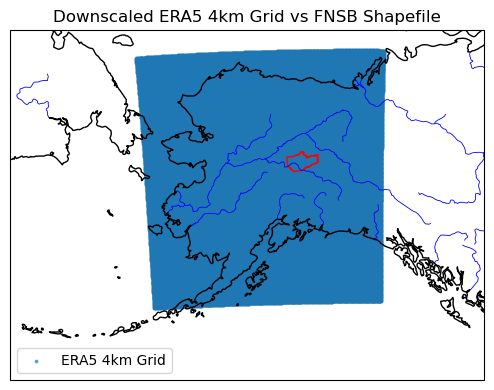

In [7]:
AK_ALBERS_SUBPLOT_KW = {'projection': ccrs.AlbersEqualArea(central_longitude=-154, central_latitude=50, standard_parallels=(55, 65))}

fig, ax = plt.subplots(subplot_kw=AK_ALBERS_SUBPLOT_KW, figsize=(10, 4))
ax.scatter(lon.values, lat.values, s=3, alpha=0.6, transform=ccrs.PlateCarree(), label='ERA5 4km Grid' )
FNSB_boundary.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, transform=ccrs.PlateCarree())

rivers = cfeature.NaturalEarthFeature(category='physical', name='rivers_lake_centerlines', scale='50m', facecolor='none',edgecolor='blue')
ax.add_feature(rivers, linewidth=0.6, zorder=3)
ax.coastlines()
ax.set_aspect('equal') 
ax.set_title("Downscaled ERA5 4km Grid vs FNSB Shapefile")
ax.set_extent([-179, -130, 51, 72], crs=ccrs.PlateCarree())
ax.legend()
fig.patch.set_alpha(0.0)
plt.tight_layout()
plt.show()

In [8]:
min_val=[]
for i in range(len(seasons)):
    val=(data['ros_days_count'].isel(season=i).min().compute().item())
    min_val.append(val)

/tmp/ipykernel_2155299/1384006132.py:22: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for coll in cf.collections:
/tmp/ipykernel_2155299/1384006132.py:25: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  cf.collections[:] = new_cf.collections


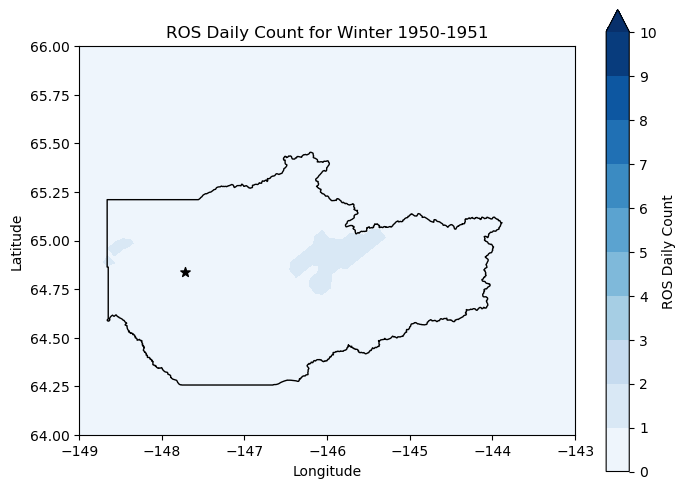

In [54]:
time_indices = range(0, len(data['season']))
levels = np.arange(0, 11, 1)
seasons = data['season'].values

fig, ax = plt.subplots(figsize=(8, 6))
ros_slice = data['ros_days_count'].isel(season=0).astype(int)

cf = ax.contourf(lon, lat, ros_slice, cmap='Blues', levels=levels, extend='max')
cbar = fig.colorbar(cf, ax=ax, ticks=levels)
cbar.set_label('ROS Daily Count')

FNSB_boundary.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, zorder=2)
ax.scatter(Fairbanks_lon, Fairbanks_lat, marker='*',color='k', zorder=5,s=50,label='Fairbanks')

ax.set_xlim(-149, -143)
ax.set_ylim(64, 66)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

def update(i):
    ros_slice = data['ros_days_count'].isel(season=i).astype(int)
    for coll in cf.collections:
        coll.remove() 
    new_cf = ax.contourf(lon, lat, ros_slice, cmap='Blues', levels=levels, extend='max')
    cf.collections[:] = new_cf.collections  
    season_label = str(data['season'].isel(season=i).values)
    ax.set_title(f"ROS Daily Count for Winter {season_label}")

ani = FuncAnimation(fig, update, frames=time_indices, interval=1000)
HTML(ani.to_jshtml())


/tmp/ipykernel_2900582/123388022.py:22: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for coll in cf.collections:
/tmp/ipykernel_2900582/123388022.py:25: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  cf.collections[:] = new_cf.collections


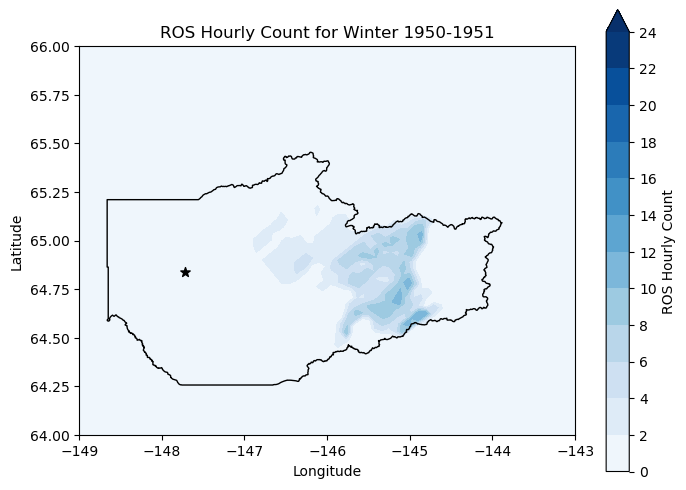

In [137]:
time_indices = range(0, len(data['season']))
levels = np.arange(0, 26, 2)
seasons = data['season'].values

fig, ax = plt.subplots(figsize=(8, 6))
ros_slice = data['ros_tally'].isel(season=0).astype(int)

cf = ax.contourf(lon, lat, ros_slice, cmap='Blues', levels=levels, extend='max')
cbar = fig.colorbar(cf, ax=ax, ticks=levels)
cbar.set_label('ROS Hourly Count')

FNSB_boundary.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, zorder=2)
ax.scatter(Fairbanks_lon, Fairbanks_lat, marker='*',color='k', zorder=5,s=50,label='Fairbanks')

ax.set_xlim(-149, -143)
ax.set_ylim(64, 66)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

def update(i):
    ros_slice = data['ros_tally'].isel(season=i).astype(int)
    for coll in cf.collections:
        coll.remove() 
    new_cf = ax.contourf(lon, lat, ros_slice, cmap='Blues', levels=levels, extend='max')
    cf.collections[:] = new_cf.collections  
    season_label = str(data['season'].isel(season=i).values)
    ax.set_title(f"ROS Hourly Count for Winter {season_label}")

ani = FuncAnimation(fig, update, frames=time_indices, interval=1000)
HTML(ani.to_jshtml())

In [10]:
average_ROS_tally=np.nanmean(data['ros_counts'],axis=0)
average_ROS_daily=np.nanmean(data['ros_days_count'],axis=0)

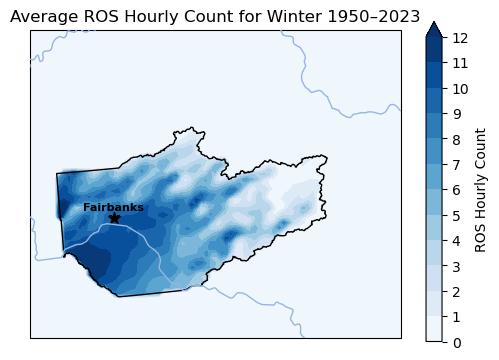

In [11]:
AK_ALBERS_SUBPLOT_KW = {'projection': ccrs.AlbersEqualArea(central_longitude=-154, central_latitude=50,standard_parallels=(55, 65))}
levels = np.arange(0, 13, 1)

fig, ax = plt.subplots(subplot_kw=AK_ALBERS_SUBPLOT_KW, figsize=(10, 4))
cf = ax.contourf(lon, lat, average_ROS_tally, levels=levels,extend='max',cmap='Blues',transform=ccrs.PlateCarree())
cbar = fig.colorbar(cf, ax=ax, label='ROS Hourly Count')
cbar.set_ticks(levels)
cbar.ax.set_position([0.77, 0.1, 0.02, 0.8])
FNSB_boundary.plot(ax=ax, facecolor='none', edgecolor='black',linewidth=1,zorder=2,transform=ccrs.PlateCarree())
ax.scatter(Fairbanks_lon, Fairbanks_lat, marker='*', color='k', zorder=5, s=75, label='Fairbanks', transform=ccrs.PlateCarree())

ax.add_feature(cfeature.BORDERS, zorder=9)
ax.add_feature(cfeature.COASTLINE, zorder=9)
ax.add_feature(cfeature.RIVERS, zorder=9)
ax.text(Fairbanks_lon, Fairbanks_lat + 0.05, 'Fairbanks', transform=ccrs.PlateCarree(),
        ha='center', va='bottom', fontsize=8, zorder=6, fontweight='bold', color='black')

ax.set_title("Average ROS Hourly Count for Winter 1950–2023")
ax.set_extent([-149, -143, 64, 66], crs=ccrs.PlateCarree()) 
ax.set_aspect('equal') 
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.show()

In [23]:
season_strings = seasons.astype(str)
season_start_years = np.array([int(season.split('-')[0]) for season in season_strings])


mask = (season_start_years >= 1991) & (season_start_years <= 2020)

average_ROS_tally_1991_2020 = np.nanmean(data['ros_counts'][mask], axis=0)
average_ROS_daily_1991_2020 = np.nanmean(data['ros_days_count'][mask], axis=0)


mask2 = (season_start_years >= 1989) & (season_start_years <= 2020)

average_ROS_tally_1989_2020 = np.nanmean(data['ros_counts'][mask2], axis=0)
average_ROS_daily_1989_2020 = np.nanmean(data['ros_days_count'][mask2], axis=0)


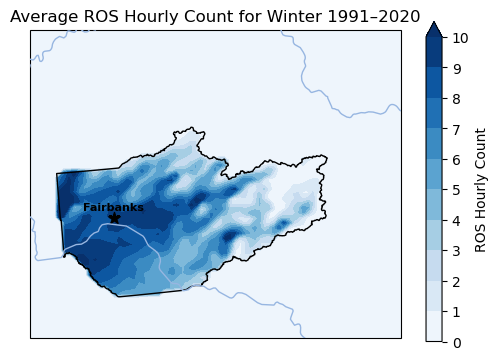

In [24]:
AK_ALBERS_SUBPLOT_KW = {'projection': ccrs.AlbersEqualArea(central_longitude=-154, central_latitude=50,standard_parallels=(55, 65))}
levels = np.arange(0, 11, 1)
#levels = np.linspace(0, 10, 100)
fig, ax = plt.subplots(subplot_kw=AK_ALBERS_SUBPLOT_KW, figsize=(10, 4))
cf = ax.contourf(lon, lat, average_ROS_tally_1991_2020, levels=levels,extend='max',cmap='Blues',transform=ccrs.PlateCarree())
cbar = fig.colorbar(cf, ax=ax, label='ROS Hourly Count')
cbar.set_ticks(levels)
cbar.ax.set_position([0.77, 0.1, 0.02, 0.8])
FNSB_boundary.plot(ax=ax, facecolor='none', edgecolor='black',linewidth=1,zorder=2,transform=ccrs.PlateCarree())
ax.scatter(Fairbanks_lon, Fairbanks_lat, marker='*', color='k', zorder=5, s=75, label='Fairbanks', transform=ccrs.PlateCarree())

ax.add_feature(cfeature.BORDERS, zorder=9)
ax.add_feature(cfeature.COASTLINE, zorder=9)
ax.add_feature(cfeature.RIVERS, zorder=9)
ax.text(Fairbanks_lon, Fairbanks_lat + 0.05, 'Fairbanks', transform=ccrs.PlateCarree(),ha='center', va='bottom', fontsize=8, zorder=6, fontweight='bold', color='black')
ax.set_title("Average ROS Hourly Count for Winter 1991–2020")
ax.set_extent([-149, -143, 64, 66], crs=ccrs.PlateCarree()) 
ax.set_aspect('equal') 
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.show()

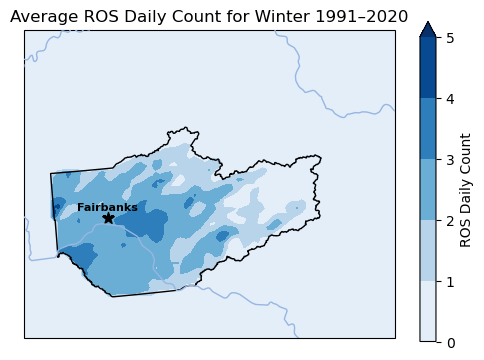

In [ ]:
AK_ALBERS_SUBPLOT_KW = {'projection': ccrs.AlbersEqualArea(central_longitude=-154, central_latitude=50,standard_parallels=(55, 65))}
levels = np.arange(0, 6, 1)

fig, ax = plt.subplots(subplot_kw=AK_ALBERS_SUBPLOT_KW, figsize=(10, 4))
cf = ax.contourf(lon, lat, average_ROS_daily_1991_2020, levels=levels,extend='max',cmap='Blues',transform=ccrs.PlateCarree())
cbar = fig.colorbar(cf, ax=ax, label='ROS Daily Count')
cbar.set_ticks(levels)
cbar.ax.set_position([0.77, 0.1, 0.02, 0.8])
FNSB_boundary.plot(ax=ax, facecolor='none', edgecolor='black',linewidth=1,zorder=2,transform=ccrs.PlateCarree())
ax.scatter(Fairbanks_lon, Fairbanks_lat, marker='*', color='k', zorder=5, s=75, label='Fairbanks', transform=ccrs.PlateCarree())

ax.add_feature(cfeature.BORDERS, zorder=9)
ax.add_feature(cfeature.COASTLINE, zorder=9)
ax.add_feature(cfeature.RIVERS, zorder=9)
ax.text(Fairbanks_lon, Fairbanks_lat + 0.05, 'Fairbanks', transform=ccrs.PlateCarree(),
        ha='center', va='bottom', fontsize=8, zorder=6, fontweight='bold', color='black')
ax.set_title("Average ROS Daily Count for Winter 1991–2020")
ax.set_extent([-149, -143, 64, 66], crs=ccrs.PlateCarree()) 
ax.set_aspect('equal') 
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
fig.patch.set_alpha(0.0)
plt.show()

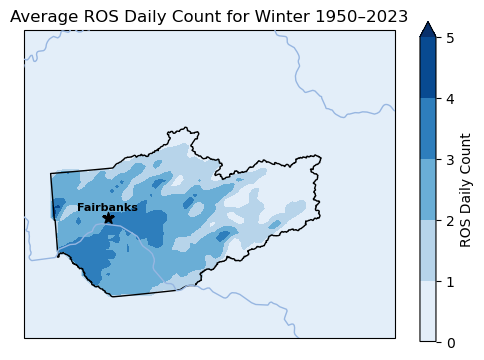

In [25]:
AK_ALBERS_SUBPLOT_KW = {'projection': ccrs.AlbersEqualArea(central_longitude=-154, central_latitude=50,standard_parallels=(55, 65))}
levels = np.arange(0, 6, 1)
#levels = np.linspace(0, 5, 100)
fig, ax = plt.subplots(subplot_kw=AK_ALBERS_SUBPLOT_KW, figsize=(10, 4))
cf = ax.contourf(lon, lat, average_ROS_daily, levels=levels,extend='max',cmap='Blues',transform=ccrs.PlateCarree())
cbar = fig.colorbar(cf, ax=ax, label='ROS Daily Count')
cbar.set_ticks(levels)
cbar.ax.set_position([0.77, 0.1, 0.02, 0.8])
FNSB_boundary.plot(ax=ax, facecolor='none', edgecolor='black',linewidth=1,zorder=2,transform=ccrs.PlateCarree())
ax.scatter(Fairbanks_lon, Fairbanks_lat, marker='*', color='k', zorder=5, s=75, label='Fairbanks', transform=ccrs.PlateCarree())

ax.add_feature(cfeature.BORDERS, zorder=9)
ax.add_feature(cfeature.COASTLINE, zorder=9)
ax.add_feature(cfeature.RIVERS, zorder=9)
ax.text(Fairbanks_lon, Fairbanks_lat + 0.05, 'Fairbanks', transform=ccrs.PlateCarree(),
        ha='center', va='bottom', fontsize=8, zorder=6, fontweight='bold', color='black')
ax.set_title("Average ROS Daily Count for Winter 1950–2023")
ax.set_extent([-149, -143, 64, 66], crs=ccrs.PlateCarree()) 
ax.set_aspect('equal') 
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
fig.patch.set_alpha(0.0)
plt.show()

Finding Max Days for each Year.. finding the max amount of days ROS was experienced in one Point

In [36]:
daily_max_values = []
for season in seasons:
    season_data = data.where(data['season'] == season, drop=True)
    
    if season_data['ros_days_count'].size == 0:
        daily_max_values.append(None)  
        continue
    max_val = season_data['ros_days_count'].max().compute().item()
    daily_max_values.append(max_val)
seasons = seasons.values.tolist()  


AttributeError: 'numpy.ndarray' object has no attribute 'values'

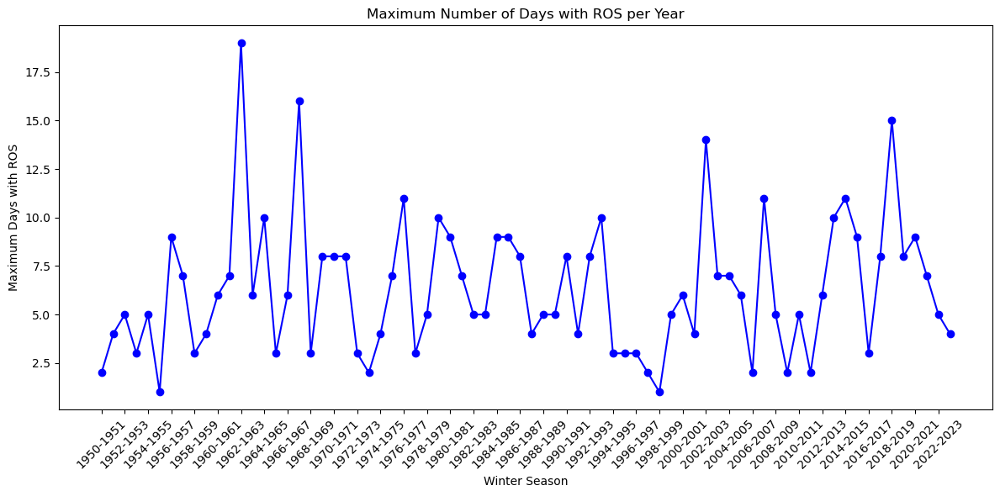

In [33]:
plt.figure(figsize=(12, 6))
plt.plot(seasons, daily_max_values, marker='o', linestyle='-', color='blue')
plt.title('Maximum Number of Days with ROS per Year')
plt.xlabel('Winter Season')
plt.ylabel('Maximum Days with ROS')
plt.xticks(ticks=range(0, len(seasons), 2), labels=seasons[::2], rotation=45)
plt.tight_layout()
fig.patch.set_alpha(0.0)
plt.show()

Adding each pixel to find out the ROS value max number for each year

In [37]:
ros_hourly_totals_climatology = []
for i in range(len(data['ros_tally'].season)):
    val = data['ros_tally'].isel(season=i).sum().compute().item()
    ros_hourly_totals_climatology.append(val)
#print(ros_hourly_totals_climatology)

In [27]:
plt.figure(figsize=(12, 6))
plt.plot(seasons, ros_hourly_totals_climatology, marker='o', linestyle='-', color='blue')
plt.title('Total Rain-on-Snow (ROS) Hours per Winter Season')
plt.xlabel('Winter Season')
plt.ylabel('Maximum Hours with ROS')
plt.xticks(ticks=range(0, len(seasons), 2), labels=seasons[::2], rotation=45)
fig.patch.set_alpha(0.0)
plt.tight_layout()
plt.show()

NameError: name 'ros_hourly_totals_climatology' is not defined

<Figure size 1200x600 with 0 Axes>

Trying to Noramlize by how many pixels are in the calculation 
- 


In [38]:
n_pixels_per_season = []

for i in range(len(data['ros_tally'].season)):
    # Get 2D field for the season
    ros_this_season = data['ros_tally'].isel(season=i)
    
    # Create a boolean mask of where ROS occurred (value > 0)
    grid_with_ros = ros_this_season > 0
    
    # Count how many grid cells had ROS
    n_pixels = grid_with_ros.sum().compute().item()
    n_pixels_per_season.append(n_pixels)

ros_hours_normalized = [total / n if n > 0 else np.nan 
                        for total, n in zip(ros_hourly_totals_climatology, n_pixels_per_season)]

In [40]:
print(len(data['ros_tally']))
print(len(n_pixels_per_season))
print(len(ros_hours_normalized))

74
74
74


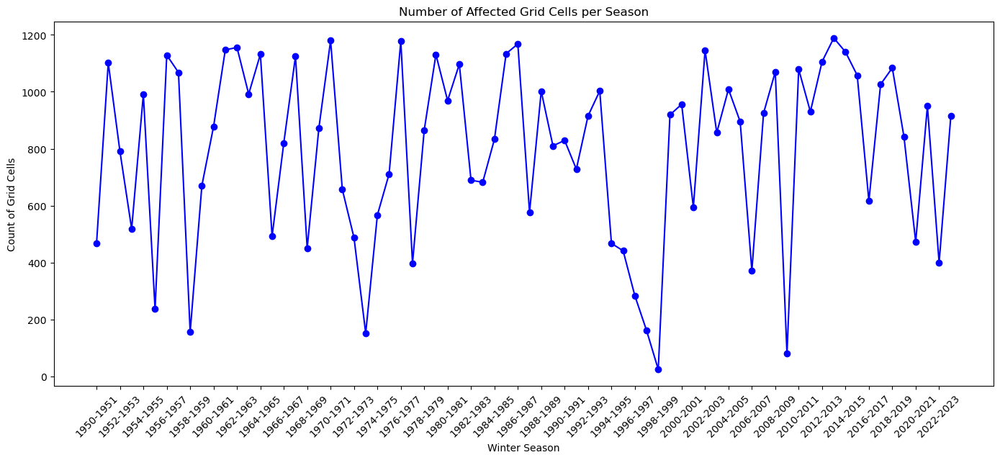

In [41]:
plt.figure(figsize=(14, 6))
plt.plot(seasons, n_pixels_per_season, marker='o', linestyle='-', color='blue')
plt.title('Number of Affected Grid Cells per Season')
plt.xlabel('Winter Season')
plt.ylabel('Count of Grid Cells')
plt.tight_layout()
plt.xticks(ticks=range(0, len(seasons), 2), labels=seasons[::2], rotation=45)
fig.patch.set_alpha(0.0)
plt.show()

This shows the Total ROS Hours (summed over all grid cells) ÷ Number of active grid cells
- 


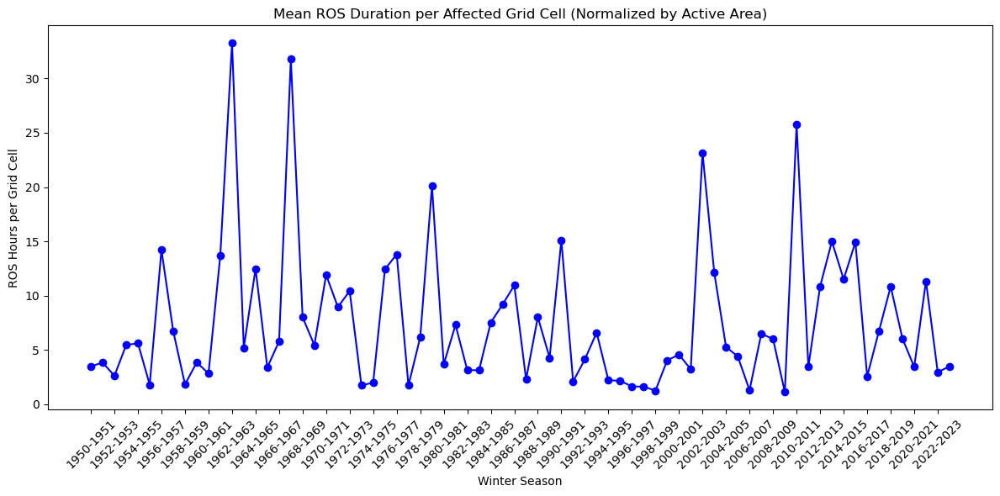

In [42]:
plt.figure(figsize=(12, 6))
plt.plot(seasons, ros_hours_normalized, marker='o', linestyle='-', color='blue')
plt.title('Mean ROS Duration per Affected Grid Cell (Normalized by Active Area)')
#plt.title('Average Rain-on-Snow Duration per Grid Cell (Normalized by Area)')
plt.xlabel('Winter Season')
plt.ylabel('ROS Hours per Grid Cell')
plt.xticks(ticks=range(0, len(seasons), 2), labels=seasons[::2], rotation=45)
plt.tight_layout()
fig.patch.set_alpha(0.0)
plt.show()

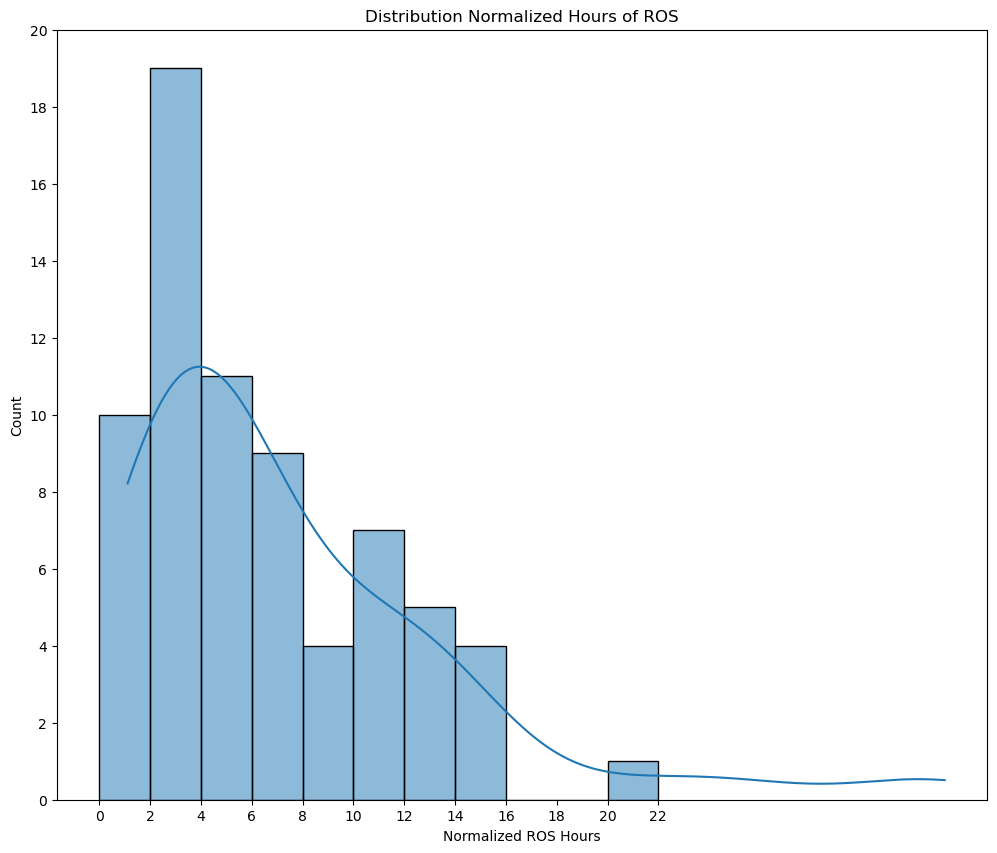

In [43]:
#ros_hours_normalized = np.random.normal(loc=10, scale=4, size=1000)
fig, ax = plt.subplots(figsize=(12, 10))
days_bins = np.arange(0, 24, 2)
sns.histplot(ros_hours_normalized, kde=True, ax=ax, bins=days_bins)
ax.set_title("Distribution Normalized Hours of ROS")
ax.set(xlabel='Normalized ROS Hours')
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.set_xticks(np.arange(0, 24,2))
ax.set_yticks(np.arange(0, 22,2))
fig.patch.set_alpha(0.0)
plt.show()

In [44]:
len(ros_hourly_totals_climatology)

74

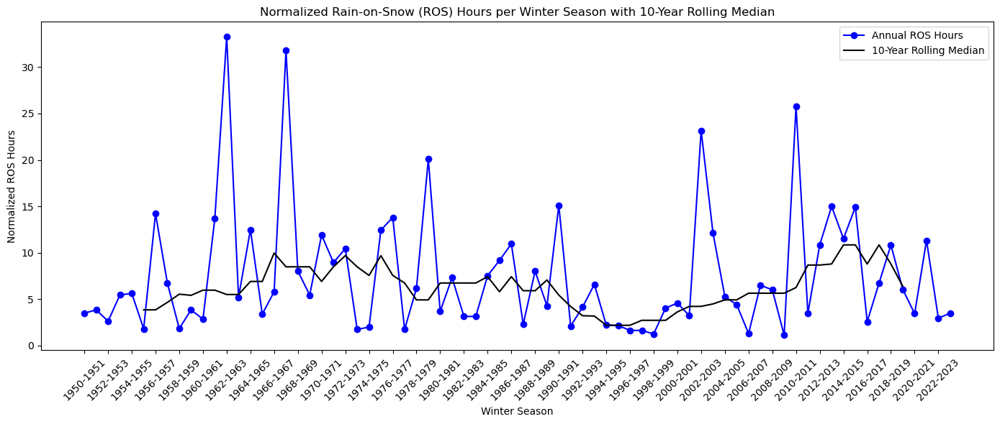

R² between ROS Hours and 10-Year Rolling Median: -0.879
Median value : 5.964


In [55]:
df = pd.DataFrame({
    'season': seasons,
    'ros_hours': ros_hourly_totals_climatology,
    'normalized':ros_hours_normalized
})
normalized_rolling_10yr_hourly = df['normalized'].rolling(window=10, center=True).median()

plt.figure(figsize=(14, 6))
plt.plot(df['season'], df['normalized'], color='blue', marker='o', label='Annual ROS Hours')
plt.plot(df['season'], normalized_rolling_10yr_hourly, color='black', marker='', label='10-Year Rolling Median')

plt.xticks(ticks=range(0, len(df['season']), 2), labels=df['season'].iloc[::2], rotation=45)
#Total Rain-on-Snow (ROS) Hours per Winter Season with 10-Year Rolling Average
plt.title('Normalized Rain-on-Snow (ROS) Hours per Winter Season with 10-Year Rolling Median')
plt.xlabel('Winter Season')
plt.ylabel('Normalized ROS Hours')
plt.legend()
plt.tight_layout()
plt.show()

from sklearn.metrics import r2_score

# Drop NaNs to align data properly
valid = ~normalized_rolling_10yr_hourly.isna()
r2 = r2_score(df['ros_hours'][valid], normalized_rolling_10yr_hourly[valid])
print(f'R² between ROS Hours and 10-Year Rolling Median: {r2:.3f}')

median=normalized_rolling_10yr_hourly.median()
print(f"Median value : {median:.3f}")


In [68]:
ros_trend_data = data['ros_tally'].values  
last_10_years = 30
seasons_last_10 = seasons[-last_10_years:]  
ros_trend_last_10 = ros_trend_data[-last_10_years:, :, :] 

ros_days=data['ros_days_count'].values
seasons_last_10 = seasons[-last_10_years:]  
ros_days_trend_last_10=ros_days[-last_10_years:,:,:]
ros_firs_10_mean=np.mean(ros_trend_last_10,axis=0)

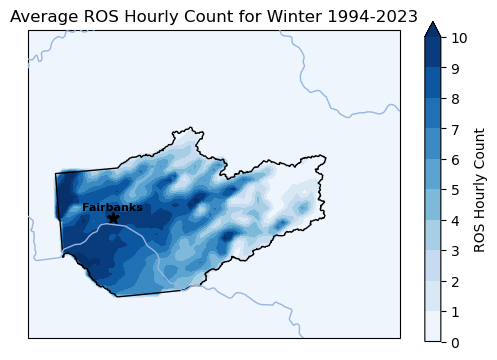

In [71]:
ros_trend_data = data['ros_tally'].values  
last_10_years = 30
seasons_last_10 = seasons[-last_10_years:]  
ros_trend_last_10 = ros_trend_data[-last_10_years:, :, :] 

ros_days=data['ros_days_count'].values
seasons_last_10 = seasons[-last_10_years:]  
ros_days_trend_last_10=ros_days[-last_10_years:,:,:]
ros_firs_10_mean=np.mean(ros_trend_last_10,axis=0)

AK_ALBERS_SUBPLOT_KW = {'projection': ccrs.AlbersEqualArea(central_longitude=-154, central_latitude=50,standard_parallels=(55, 65))}
levels = np.arange(0, 11, 1)

fig, ax = plt.subplots(subplot_kw=AK_ALBERS_SUBPLOT_KW, figsize=(10, 4))
cf = ax.contourf(lon, lat, np.mean(ros_trend_last_10,axis=0) , levels=levels,extend='max',cmap='Blues',transform=ccrs.PlateCarree())
cbar = fig.colorbar(cf, ax=ax, label='ROS Hourly Count')
cbar.set_ticks(levels)
cbar.ax.set_position([0.77, 0.1, 0.02, 0.8])
FNSB_boundary.plot(ax=ax, facecolor='none', edgecolor='black',linewidth=1,zorder=2,transform=ccrs.PlateCarree())
ax.scatter(Fairbanks_lon, Fairbanks_lat, marker='*', color='k', zorder=5, s=75, label='Fairbanks', transform=ccrs.PlateCarree())

ax.add_feature(cfeature.BORDERS, zorder=9)
ax.add_feature(cfeature.COASTLINE, zorder=9)
ax.add_feature(cfeature.RIVERS, zorder=9)
ax.text(Fairbanks_lon, Fairbanks_lat + 0.05, 'Fairbanks', transform=ccrs.PlateCarree(),
        ha='center', va='bottom', fontsize=8, zorder=6, fontweight='bold', color='black')
ax.set_title("Average ROS Hourly Count for Winter 1994-2023")
ax.set_extent([-149, -143, 64, 66], crs=ccrs.PlateCarree()) 
ax.set_aspect('equal') 
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
fig.patch.set_alpha(0.0)
plt.show()

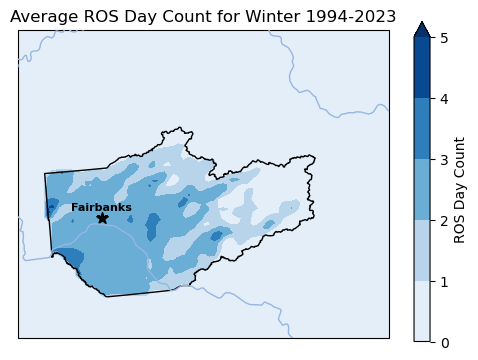

In [27]:
AK_ALBERS_SUBPLOT_KW = {'projection': ccrs.AlbersEqualArea(central_longitude=-154, central_latitude=50,standard_parallels=(55, 65))}
levels = np.arange(0, 6, 1)

fig, ax = plt.subplots(subplot_kw=AK_ALBERS_SUBPLOT_KW, figsize=(10, 4))
cf = ax.contourf(lon, lat, np.mean(ros_days_trend_last_10,axis=0) , levels=levels,extend='max',cmap='Blues',transform=ccrs.PlateCarree())
cbar = fig.colorbar(cf, ax=ax, label='ROS Day Count')
cbar.set_ticks(levels)
cbar.ax.set_position([0.77, 0.1, 0.02, 0.8])
FNSB_boundary.plot(ax=ax, facecolor='none', edgecolor='black',linewidth=1,zorder=2,transform=ccrs.PlateCarree())
ax.scatter(Fairbanks_lon, Fairbanks_lat, marker='*', color='k', zorder=5, s=75, label='Fairbanks', transform=ccrs.PlateCarree())

ax.add_feature(cfeature.BORDERS, zorder=9)
ax.add_feature(cfeature.COASTLINE, zorder=9)
ax.add_feature(cfeature.RIVERS, zorder=9)
ax.text(Fairbanks_lon, Fairbanks_lat + 0.05, 'Fairbanks', transform=ccrs.PlateCarree(),
        ha='center', va='bottom', fontsize=8, zorder=6, fontweight='bold', color='black')
ax.set_title("Average ROS Day Count for Winter 1994-2023")
ax.set_extent([-149, -143, 64, 66], crs=ccrs.PlateCarree()) 
ax.set_aspect('equal') 
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
fig.patch.set_alpha(0.0)
plt.show()

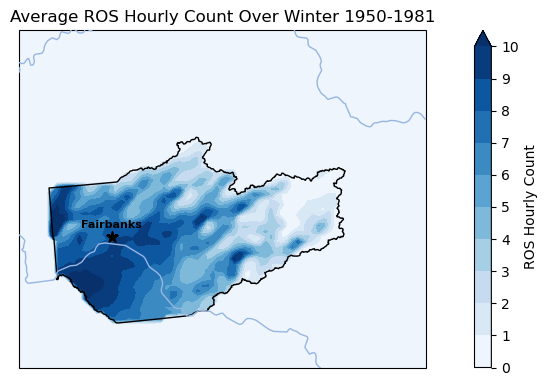

In [72]:
#FIRST 30 YEARS IN DATASET
#1950 -1981
ros_trend_data = data['ros_tally'].values  
last_10_years = 30
seasons_last_10 = seasons[last_10_years:]  
ros_trend_last_10 = ros_trend_data[last_10_years:, :, :]  
ros_last_10_mean=np.mean(ros_trend_last_10,axis=0)

AK_ALBERS_SUBPLOT_KW = {
    'projection': ccrs.AlbersEqualArea(central_longitude=-154, central_latitude=50, standard_parallels=(55, 65))}
levels = np.arange(0, 11,1)
cmap = plt.get_cmap('Blues')
fig, ax = plt.subplots(subplot_kw=AK_ALBERS_SUBPLOT_KW, figsize=(10, 4))
cf = ax.contourf(lon, lat, ros_last_10_mean, levels=levels, cmap=cmap, extend='max', transform=ccrs.PlateCarree())
cbar = fig.colorbar(cf, ax=ax, label='ROS Hourly Count')
cbar.set_ticks(levels)
cbar.ax.set_position([0.77, 0.1, 0.02, 0.8])

FNSB_boundary.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, zorder=2, transform=ccrs.PlateCarree())
ax.scatter(Fairbanks_lon, Fairbanks_lat, marker='*', color='k', zorder=5, s=75, label='Fairbanks', transform=ccrs.PlateCarree())
ax.text(Fairbanks_lon, Fairbanks_lat + 0.05, 'Fairbanks',
        transform=ccrs.PlateCarree(), ha='center', va='bottom',
        fontsize=8, zorder=6, fontweight='bold', color='black')
ax.add_feature(cfeature.BORDERS, zorder=9)
ax.add_feature(cfeature.COASTLINE, zorder=9)
ax.add_feature(cfeature.RIVERS, zorder=9)

ax.set_extent([-149, -143, 64, 66], crs=ccrs.PlateCarree())
ax.set_aspect('equal')
ax.set_title("Average ROS Hourly Count Over Winter 1950-1981")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
fig.patch.set_alpha(0.0)
plt.tight_layout()
plt.show()

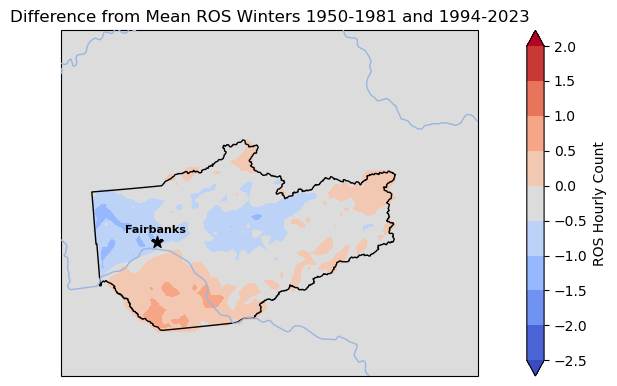

In [73]:
diff= ros_last_10_mean-ros_firs_10_mean

AK_ALBERS_SUBPLOT_KW = {
    'projection': ccrs.AlbersEqualArea(central_longitude=-154, central_latitude=50, standard_parallels=(55, 65))}
levels = np.arange(-2.5, 2.5,0.5)
cmap = plt.get_cmap('coolwarm')
fig, ax = plt.subplots(subplot_kw=AK_ALBERS_SUBPLOT_KW, figsize=(10, 4))
cf = ax.contourf(lon, lat, diff, levels=levels, cmap=cmap, extend='both', transform=ccrs.PlateCarree())
cbar = fig.colorbar(cf, ax=ax, label='ROS Hourly Count')
cbar.set_ticks(levels)
cbar.ax.set_position([0.77, 0.1, 0.02, 0.8])

FNSB_boundary.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, zorder=2, transform=ccrs.PlateCarree())
ax.scatter(Fairbanks_lon, Fairbanks_lat, marker='*', color='k', zorder=5, s=75, label='Fairbanks', transform=ccrs.PlateCarree())
ax.text(Fairbanks_lon, Fairbanks_lat + 0.05, 'Fairbanks',
        transform=ccrs.PlateCarree(), ha='center', va='bottom',
        fontsize=8, zorder=6, fontweight='bold', color='black')
ax.add_feature(cfeature.BORDERS, zorder=9)
ax.add_feature(cfeature.COASTLINE, zorder=9)
ax.add_feature(cfeature.RIVERS, zorder=9)

ax.set_extent([-149, -143, 64, 66], crs=ccrs.PlateCarree())
ax.set_aspect('equal')
ax.set_title("Difference from Mean ROS Winters 1950-1981 and 1994-2023")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
fig.patch.set_alpha(0.0)
plt.tight_layout()
plt.show()